# UE Computer Vision | Lab Session 3 - Optical flow

pierre-henri.conze@imt-atlantique.fr

Student names = MAHJOUB Skander

The objectives of this lab session are as follows:
* understand and implement the *Horn and Schunck*'s optical flow method,
* evaluate this method using dedicated functions,
* compare the obtained results with other optical flow methods,
* perform long-term motion estimation

Beforehand, let us import the data provided into the **Colab** session ! The content of both `images` and `sequence` folders must be imported.

## I - Theory

The starting point for most optical flow estimation methods is to assume that the intensity of a given point remains constant between two consecutive images, whatever the nature of its motion. The following **brightness constancy constraint** arises:

\begin{align*}
\frac{\partial I(x,t)}{\partial t} + u(x). \nabla I(x,t) = 0
\end{align*}

Assuming small displacements and spatio-temporal differentiability of intensity, we observe that temporal changes are equivalent to the scalar product between spatial changes and apparent motion. Motion estimation using intensity conservation as only constraint is an **under-determined** problem. The above equation alone does not allow to estimate the two unknown variables $u(x)=\big(u(x,y),v(x,y)\big)$. This problem, known as the **aperture problem**, can be circumvented by adding **local** or **global constraints**.

Contrary to *Lucas-Kanade*'s optical flow method ([paper](http://www.cs.princeton.edu/courses/archive/spring04/cos429/papers/lucas_kanade.pdf)) which exploits local contraints, the so-called **global approaches** including *Horn Schunck*'s optical flow ([paper](http://people.csail.mit.edu/bkph/AIM/AIM-572.pdf)) introduce a hypothesis of continuity (smoothing) of the deformation field. The regularization leads to the minimization of a functional with a **data term** and a **smoothing term** to model how optical flow varies spatially:

\begin{align*}
min_{\substack{(u,v)}}
\left(
\int_{\Omega}
\left[
\frac{\partial I(x,t)}{\partial t}
+ u(x).\nabla I(x,t)
\right]^{2}
+ \lambda \left[(\frac{\partial u}{\partial x})^2+(\frac{\partial u}{\partial y})^2+(\frac{\partial v}{\partial x})^2+(\frac{\partial v}{\partial y})^2 \right]d\Omega
\right)
\end{align*}

**Question 1 -** The minimization of the quadratic *Horn Schunck* **functional** leads to the following **iterative resolution scheme**:

\begin{align*}
\left\{
\begin{array}{l}
u^{k} = \bar{u}^{k-1} - I_{x}(I_{x}\bar{u}^{k-1}+I_{y}\bar{v}^{k-1}+I_{t}).(I_{x}^{2}+I_{y}^{2}+\lambda)^{-1} \\
v^{k} = \bar{v}^{k-1} - I_{y}(I_{x}\bar{u}^{k-1}+I_{y}\bar{v}^{k-1}+I_{t}).(I_{x}^{2}+I_{y}^{2}+\lambda)^{-1} \\
\end{array}
\right.
\end{align*}

Retrieve this result analytically (see appendix):

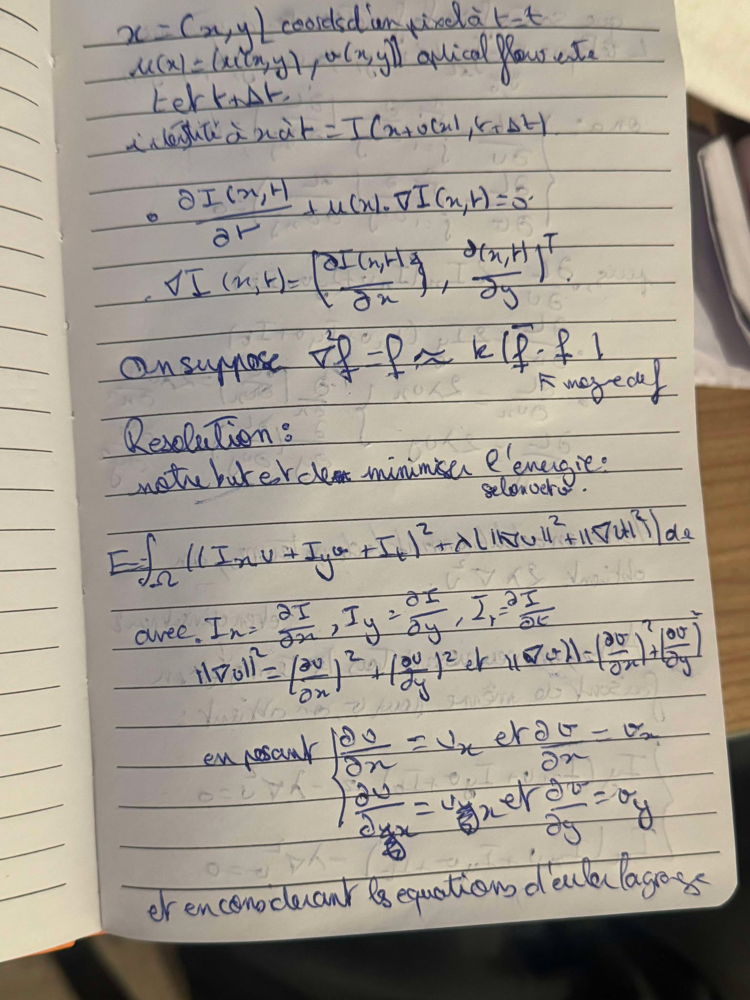

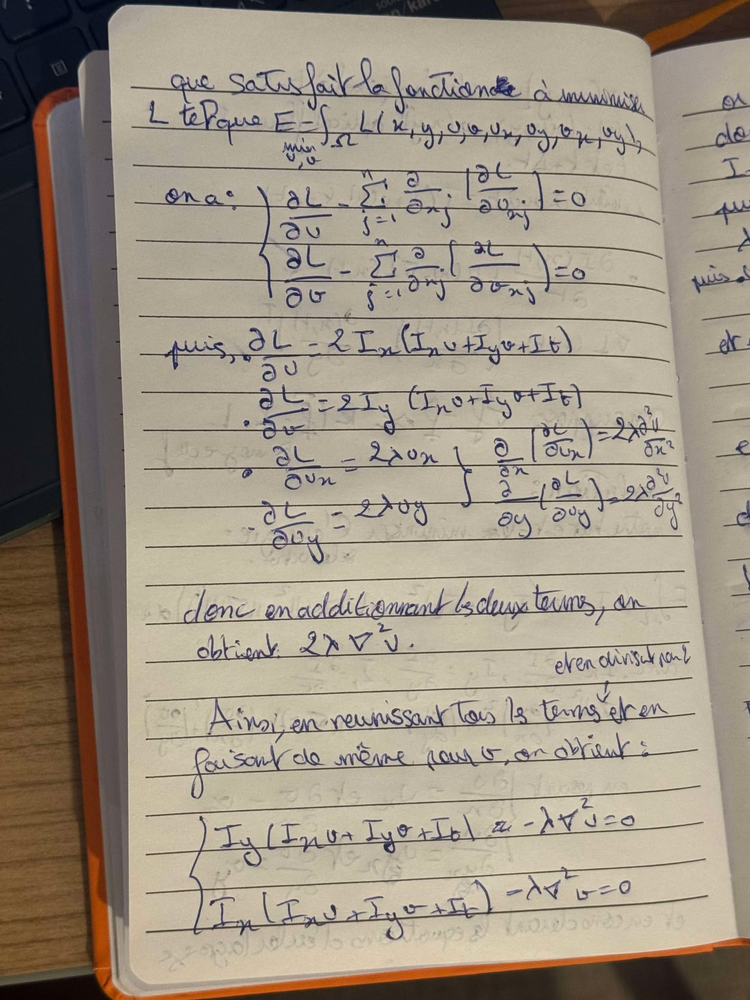

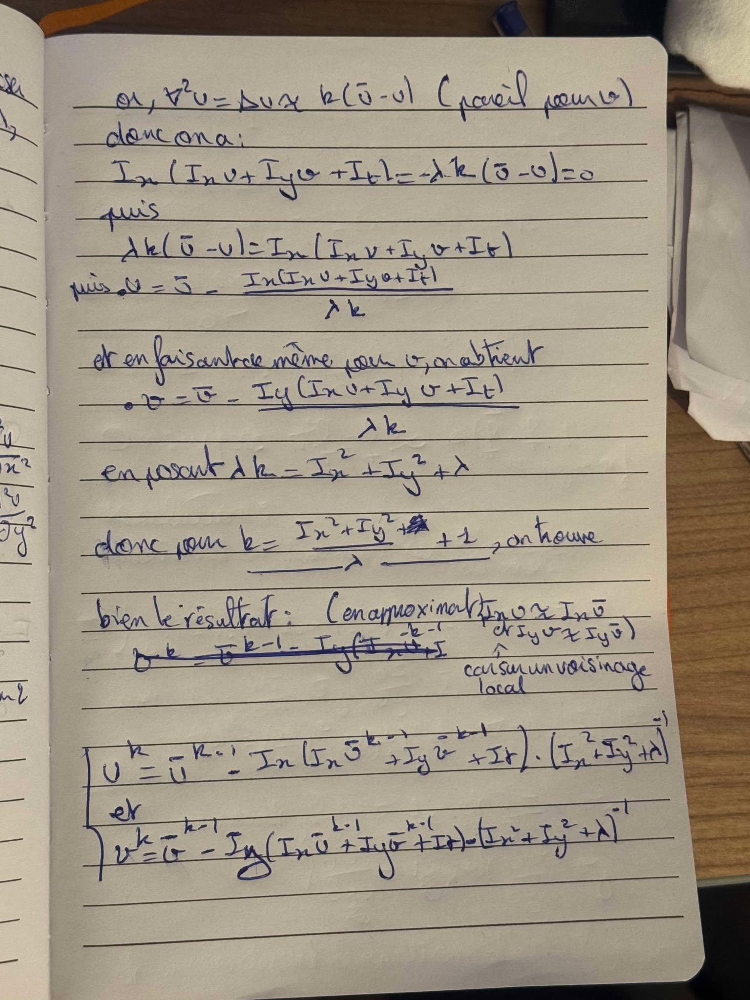

**Question 2 -** What is the main advantage of global methods such as *Horn Schunck* compared to local methods for the specific case of uniform areas?

**Answer**: The mai aadvantage is that in uniform regions, Horn-Schunck is more robust because it smooths the flow by considering the entire image, whereas a local method struggles due to the lack of local intensity variations.

## II - Implementation of *Horn and Schunck's* method

The goal of this part is to implement and evaluate the *Horn and Schunck*'s optical flow method ([paper](http://people.csail.mit.edu/bkph/AIM/AIM-572.pdf)). Let us focus on a first image pair, `taxi1/2.png`.

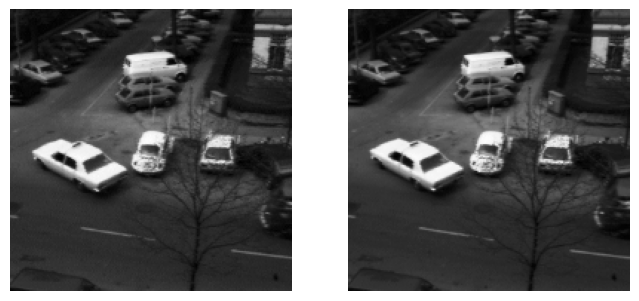

In [1]:
from skimage import io
import numpy as np
import matplotlib.pyplot as plt

name = 'taxi'
img1 = io.imread(name+'1.png').astype(np.float32)/255.
img2 = io.imread(name+'2.png').astype(np.float32)/255.

plt.figure(figsize=(8, 4))
plt.subplot(121)
plt.axis('off')
plt.imshow(img1,cmap='gray')
plt.subplot(122)
plt.axis('off')
plt.imshow(img2,cmap='gray')
plt.show()

**Question 3 -** Implement the function `estimate_derivative()` whose goal is to compute spatial (in x- and y- directions) and temporal derivatives. These derivatives can be obtained by convolving (`scipy.ndimage.filters.convolve()`) the image with provided kernels `kernelX`, `kernelX` and `kernelT`. To validate the implementation, visualize the spatial and temporal derivative maps on the image pair `taxi1/2.png` using `plotderiv()`.

In [2]:
from scipy.ndimage import convolve

def estimate_derivatives(img1, img2):
    kernelX = np.array([[-1, -1],[1, 1]])*.25  # kernel for computing d/dx
    kernelY = np.array([[-1, 1],[ -1, 1]])*.25 # kernel for computing d/dy
    kernelT = np.ones((2,2))*.25

    fx = convolve(img1, kernelX) + convolve(img2, kernelX)
    fy = convolve(img1, kernelY) + convolve(img2, kernelY)
    ft =convolve(img1, kernelT) - convolve(img2, kernelT)
    return fx, fy, ft

In [3]:
def plotderiv(fx,fy,ft):
    fg,ax = plt.subplots(1,3,figsize=(18,5))
    for f,a,t in zip((fx,fy,ft),ax,('$f_x$','$f_y$','$f_t$')):
        h=a.imshow(f,cmap='bwr')
        a.set_title(t)
        fg.colorbar(h,ax=a)
    plt.show()

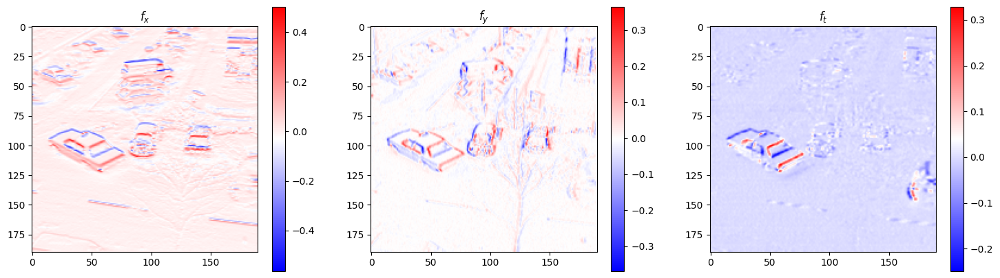

In [4]:
fx, fy, ft = estimate_derivatives(img1, img2)
plotderiv(fx,fy,ft)

To compute *Horn and Schunck's* optical flow, we need to:
* estimate spatial and temporal derivated (`estimate_derivatives()`),
* compute averaged displacement fields,
* update the displacement field according to the resolution scheme indicated above.

The two last steps are performed iteratively.

**Question 4 -** Make the implementation of the function `flow = horn\_schunck(img1, img2, lambda_, Niter)`. This function will take as input two grayscale images (`img1`, `img2`), the relative weight `lambda_` between the data attachment and the regularization terms as well as the desired number of iterations (`Niter`). As an output, `horn_schunck()` will return a dense field of matches from `img1` to `img2` in the form of an *numpy* array of floating type and size `[nb\_row, nb\_col, 2]` where `nb_row` (resp. `nb_col`) correspond to the number of lines (columns) of image `img1`. To be compatible with the provided visualization functions, `flow[:,:,0]`. (resp. `flow[:,:,1]`) must contain estimates of the `v` (resp. `u`) component.

In [5]:
import numpy as np
def horn_schunck(img1, img2, lambda_, Niter):
    kernelA = np.array([[1./12, 1./6, 1./12], [1./6, 0, 1./6], [1./12, 1./6, 1./12]], float)

    fx, fy, ft = estimate_derivatives(img1, img2)
    u = np.zeros_like(img1)
    v = np.zeros_like(img1)

    for _ in range(Niter):
        u_avg = convolve(u, kernelA)
        v_avg = convolve(v, kernelA)

        numerator = fx * u_avg + fy * v_avg + ft
        denominator = lambda_ + fx**2 + fy**2

        u = u_avg - fx * (numerator / denominator)
        v = v_avg - fy * (numerator / denominator)

    flow = np.stack((v, u), axis=-1)
    return flow

**Question 5 -** Apply the `horn_schunck()` function on the pair of images `taxi1/2.png` with a low weighting factor `lambda_` of 0.001 and 200 iterations (`Niter`).

In [6]:
lambda_ = 0.001
Niter = 200
flow = horn_schunck(img1, img2, lambda_, Niter)

**Question 6 -** To evaluate the results qualitatively, you have two functions at your disposal:
`draw_hsv(flow)` which allows to visualize the displacement field using the color wheel and `draw_flow(img, flow, step)` which super-imposes to the image `img1` the optical flow vectors of pixels located on a regular grid (to be defined via the parameter `step`). Write a function `visualization(img1, img2, flow, step)` displaying the two source images (`img1`, `img2`) as well as `draw_hsv(flow)` and `draw_flow(img, flow, step)` outputs and use it for the image pair `taxi1/2.png`. Comment on the accuracy.

In [7]:
import cv2

def draw_flow(img, flow, step):
    h, w = img.shape[:2]
    y, x = np.mgrid[step/2:h:step, step/2:w:step].reshape(2,-1).astype(int)
    fx, fy = flow[y,x].T
    lines = np.vstack([x, y, x-fx, y-fy]).T.reshape(-1, 2, 2)
    lines = np.int32(lines + 0.5)
    vis = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    cv2.polylines(vis, lines, 0, (0, 1, 0))
    for (x1, y1), (x2, y2) in lines:
        if abs(x1-x2)>1 or abs(y1-y2)>1:
            cv2.circle(vis, (x1, y1), 1, (0, 1, 0), -1)
    return vis

def draw_hsv(flow):
    flow = -flow
    h, w = flow.shape[:2]
    hsv = np.zeros((h, w, 3), np.uint8)
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,1] = 255
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
    return rgb

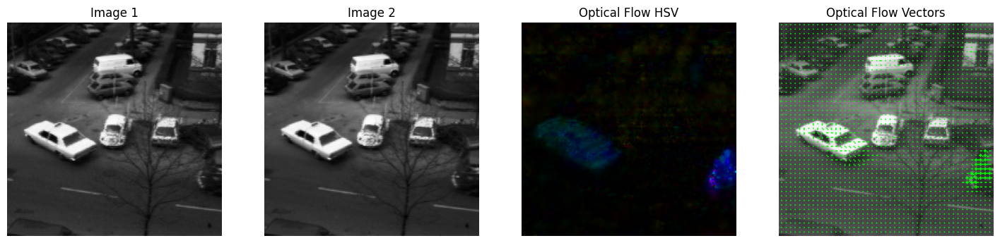

In [8]:
def visualization(img1, img2, flow, step):
    plt.figure(figsize=(18, 4))

    plt.subplot(1, 4, 1)
    plt.axis("off")
    plt.title("Image 1")
    plt.imshow(img1, cmap="gray")

    plt.subplot(1, 4, 2)
    plt.axis("off")
    plt.title("Image 2")
    plt.imshow(img2, cmap="gray")

    plt.subplot(1, 4, 3)
    plt.axis("off")
    plt.title("Optical Flow HSV")
    plt.imshow(draw_hsv(flow))

    plt.subplot(1, 4, 4)
    plt.axis("off")
    plt.title("Optical Flow Vectors")
    plt.imshow(draw_flow(img1, flow, step))

    plt.show()

step = 4
visualization(img1, img2, flow, step)

**Answer**: the positive point of this method is that it captures the areas where optical flow is present. However, this method is not very precise. Indeed, we notice that the details are not highlighted at all. We barely recognize the shape of the cars.

**Question 7 -** Apply the *Horn and Schunck's* method (on `taxi1/2.png`) by gradually increasing the $\lambda$ weighting factor (from 0.00001 to 0.1) between the data attachment and regularization terms. What do we observe? Which value seems to be optimal?

Lambda = 1e-05


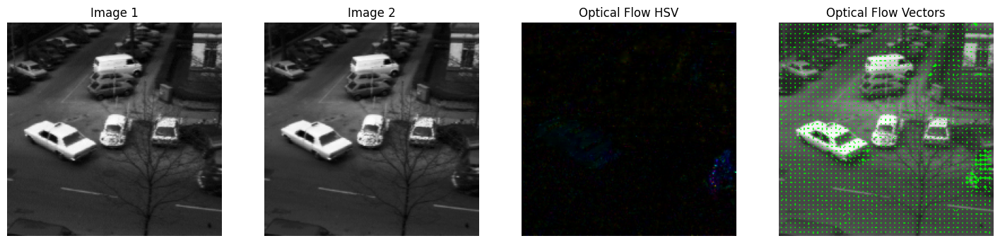

Lambda = 0.0001


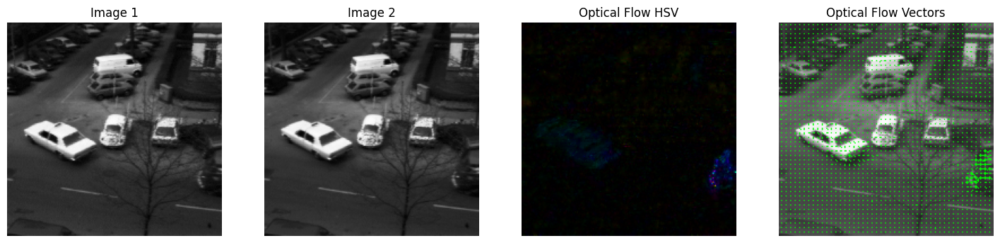

Lambda = 0.001


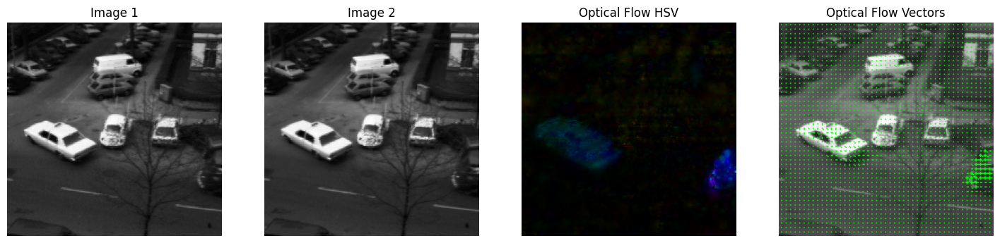

Lambda = 0.01


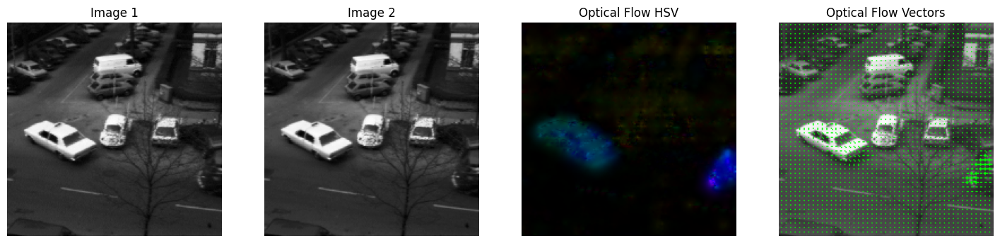

Lambda = 0.1


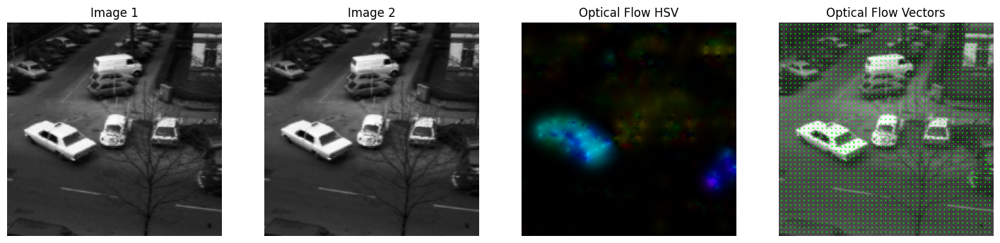

In [9]:
lambdas = [0.00001, 0.0001, 0.001, 0.01, 0.1]
Niter = 100

for lambda_ in lambdas:
    flow = horn_schunck(img1, img2, lambda_, Niter)
    print(f"Lambda = {lambda_}")
    visualization(img1, img2, flow, step=4)


**Anwser**: We observe that the more we increase lambda, the more sensitive the algorithm is to movement and therefore the optical flow is more highlighted.
The value lambda= 0.1 seems to be the optimal value because it shows the shape of a taxi. the details are more marked, it is no longer just a vague shape. Nevertheless, the algorithm becomes very sensitive, we see an optical flow appear at the level of the trees which is not necessarily desired


**Question 8 -** Which image pre-processing can also lead to spatial smoothing of the deformation field? Implement this pre-processing and test the implementation of the *Horn and Schunck*'s method for the following image pairs: `taxi1/2.png`, `traffic1/2.png`, `table1/2.png` and `car1/2.png`.

taxi


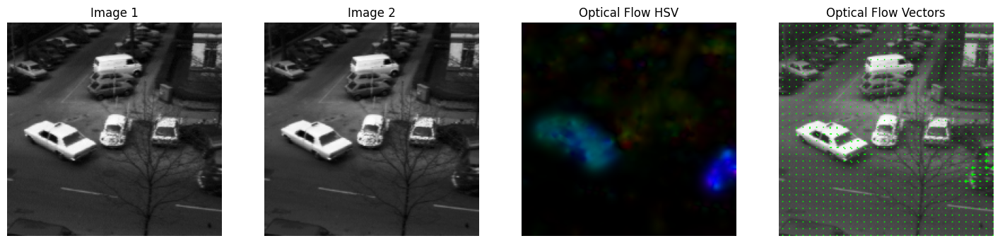

traffic


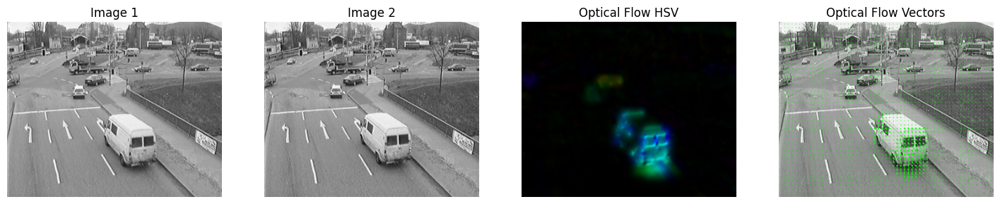

table


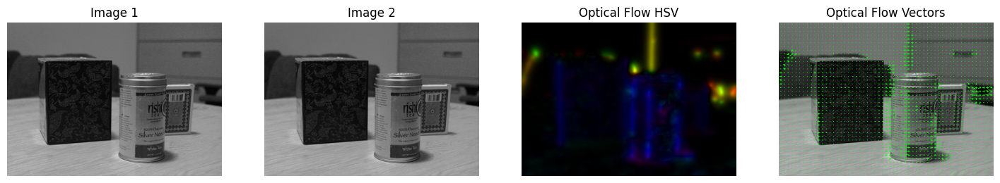

car


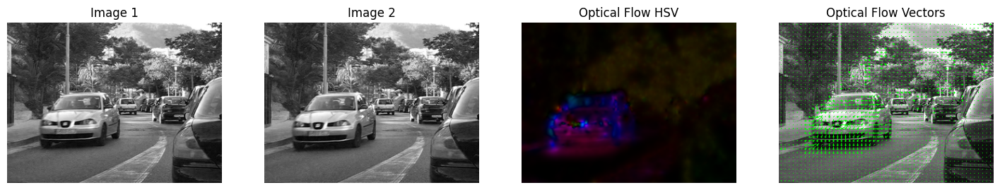

In [10]:
from skimage import filters
lambda_ = 0.01
sigma = 1.5
step = 6

for name in ['taxi', 'traffic', 'table', 'car']:
    print(name)
    img1 = io.imread(name+'1.png').astype(np.float32)/255.
    img2 = io.imread(name+'2.png').astype(np.float32)/255.
    img1_smooth = filters.gaussian(img1, sigma=sigma)
    img2_smooth = filters.gaussian(img2, sigma=sigma)

    flow = horn_schunck(img1_smooth, img2_smooth, lambda_, Niter)

    visualization(img1, img2, flow, step)


**Question 9 -** What is the limitation of the *Horn-Schunck*'s method in areas with motion discontinuities?

**Answer**: The Horn-Schunck method struggles with sharp motion transitions due to its smoothness constraint, making it less effective for scenes with multiple independent motions.

**Question 10 -** Study the specific
case of large motion on the image pair `bike1/2.png`. Does the implemented method offer a good estimation for this case? Why?

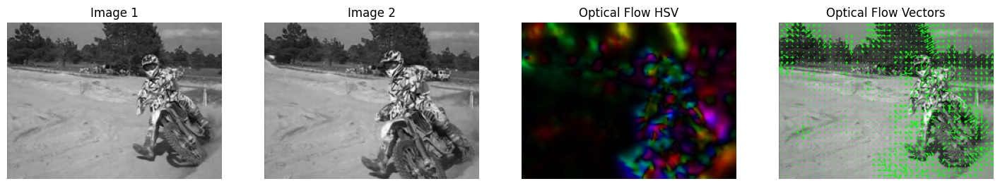

In [11]:
name = 'bike'
img1 = io.imread(name+'1.png').astype(np.float32) / 255.
img2 = io.imread(name+'2.png').astype(np.float32) / 255.

lambda_ = 0.01
Niter = 100
sigma = 1.5
step = 6

img1_smooth = filters.gaussian(img1, sigma=sigma)
img2_smooth = filters.gaussian(img2, sigma=sigma)

flow = horn_schunck(img1_smooth, img2_smooth, lambda_, Niter)

visualization(img1, img2, flow, step)


**Answer**: In this specific case, the method does not give a good estimate of the optical flow. Indeed, the problem is that the texture of the biker and the motorcycle is too complex and the algorithm cannot properly estimate the optical flow. We find the same problem for example with smoke or window reflections (see the flipped classroom video)



***

## III - Comparison between optical flow estimators

The objective of this part is to compare *Horn and Schunck*'s optical flow method with other approaches: *Lucas-Kanade* ([paper](http://www.cs.princeton.edu/courses/archive/spring04/cos429/papers/lucas_kanade.pdf)) and *Farneback* ([paper](http://www.diva-portal.org/smash/get/diva2:273847/FULLTEXT01.pdf)).

In [12]:
def lucas_kanade(img1, img2, window_size=21, tau=1e-2):
    w = int(window_size/2)
    fx, fy, ft = estimate_derivatives(img1, img2)
    u = np.zeros(img1.shape)
    v = np.zeros(img1.shape)
    for i in range(w, img1.shape[0]-w):
        for j in range(w, img1.shape[1]-w):
            Ix = fx[i-w:i+w+1, j-w:j+w+1].flatten()
            Iy = fy[i-w:i+w+1, j-w:j+w+1].flatten()
            It = ft[i-w:i+w+1, j-w:j+w+1].flatten()
            b = np.reshape(It, (It.shape[0],1))
            A = np.vstack((Ix, Iy)).T
            if np.min(abs(np.linalg.eigvals(np.matmul(A.T, A)))) >= tau:
                nu = np.matmul(np.linalg.pinv(A), b)
                u[i,j]=nu[0,0]
                v[i,j]=nu[1,0]
    flow = np.zeros((u.shape[0],u.shape[1],2))
    flow[:,:,0], flow[:,:,1]  = -v, -u
    return flow

In [13]:
def farneback(img1, img2):
    flow = np.zeros((img1.shape[0],img1.shape[1],2))
    img1 = (img1*255.).astype(np.uint8)
    img2 = (img2*255.).astype(np.uint8)
    return cv2.calcOpticalFlowFarneback(img1, img2, flow, pyr_scale=0.5, levels=3, winsize=7, iterations=3, poly_n=5, poly_sigma=1.2, flags=0)

**Question 11 -** Exploit image pairs `taxi1/2.png`, `traffic1/2.png`, `table1/2.png`, `car1/2.png` and `bike1/2.png` to compare results obtained by *Horn and Schunck*'s estimator with those from *Lucas-Kanade* and *Farneback* using `draw_flow()` and `draw_hsv()` routines.

taxi


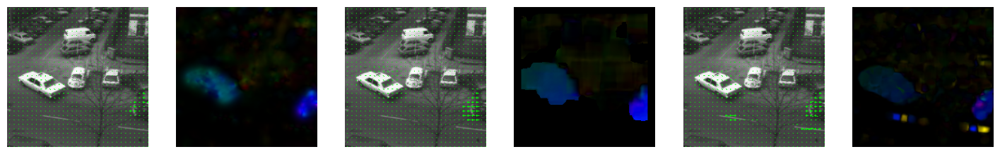

traffic


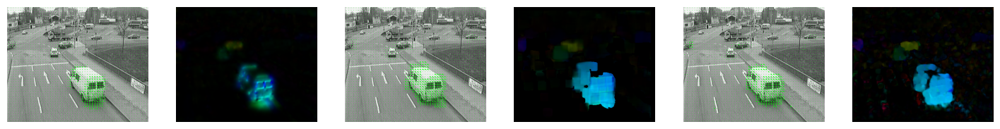

table


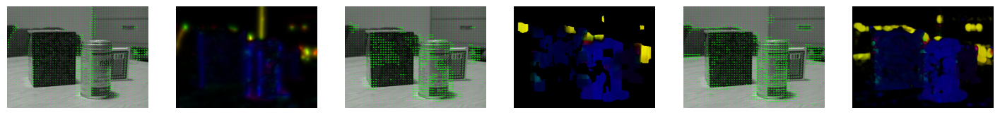

car


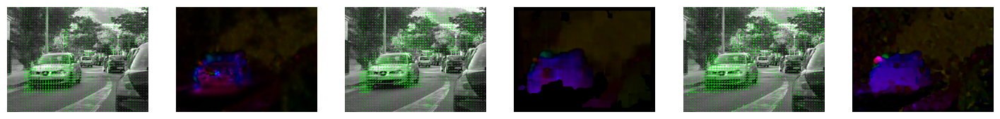

bike


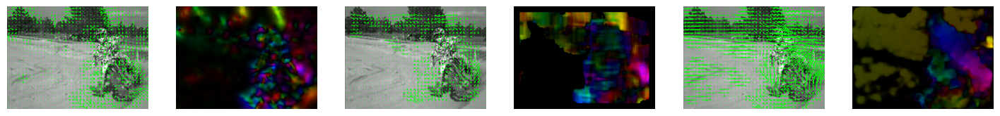

In [14]:
for name in ['taxi', 'traffic', 'table', 'car', 'bike']:
    print(name)
    img1 = io.imread(name+'1.png').astype(np.float32)/255.
    img2 = io.imread(name+'2.png').astype(np.float32)/255.
    img1_smooth = filters.gaussian(img1, sigma=sigma)
    img2_smooth = filters.gaussian(img2, sigma=sigma)
    flow_HS = horn_schunck(img1_smooth, img2_smooth, lambda_, Niter)
    flow_LK = lucas_kanade(img1_smooth, img2_smooth)
    flow_Fa = farneback(img1_smooth, img2_smooth)
    plt.figure(figsize=(18, 4))
    plt.subplot(161)
    plt.axis('off')
    plt.imshow(draw_flow(img1, flow_HS, step))
    plt.subplot(162)
    plt.axis('off')
    plt.imshow(draw_hsv(flow_HS))
    plt.subplot(163)
    plt.axis('off')
    plt.imshow(draw_flow(img1, flow_LK, step))
    plt.subplot(164)
    plt.axis('off')
    plt.imshow(draw_hsv(flow_LK))
    plt.subplot(165)
    plt.axis('off')
    plt.imshow(draw_flow(img1, flow_Fa, step))
    plt.subplot(166)
    plt.axis('off')
    plt.imshow(draw_hsv(flow_Fa))
    plt.show()

**Question 12 -** Implement a warping function `warp(flowFW,img2) `allowing, through retro-propagation, to reconstruct the image `img1` with the intensities of the pixels of the image `img2`.

In [15]:
def warp(flowFW,img2):
    warp = np.zeros((img2.shape[0],img2.shape[1])) # assumes that img1 and img2 have the same dimensions
    pos = np.where(warp == 0)
    for px in range(len(pos[0])):   # fill warp with greyscale values retro-propagated from img2
        y, x = pos[0][px], pos[1][px]
        new_x = int(x - flowFW[y, x, 0])
        new_y = int(y - flowFW[y, x, 1])
        if 0 <= new_x < img2.shape[1] and 0 <= new_y < img2.shape[0]:
            warp[y, x] = img2[new_y, new_x]
    return warp.astype(np.float32)

**Question 13 -** Compare the reconstructed images obtained through the optical flow fields estimated by *Horn Schunck*, *Lucas Kanade* and *Farneback* estimators. In particular, visualize absolute difference images between *img1* and reconstructed images. Compute the *Peak Signal to Noise Ratio* (PSNR) between reconstructed images and source images by mean of the `skimage.measure.compare_psnr()` routine. Compare the scores obtained on several pairs of images (`taxi1/2.png`, `traffic1/2.png`, `table1/2.png`, `car1/2.png`, `bike1/2.png`). Which one seems to be the best optical flow estimator?

taxi


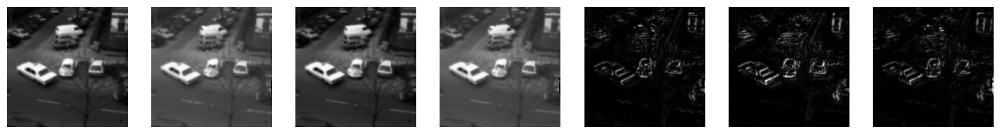

traffic


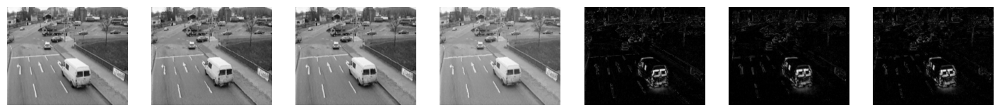

table


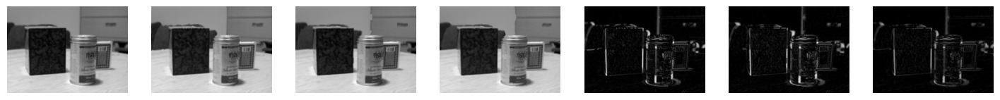

car


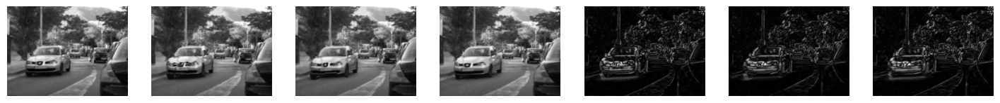

bike


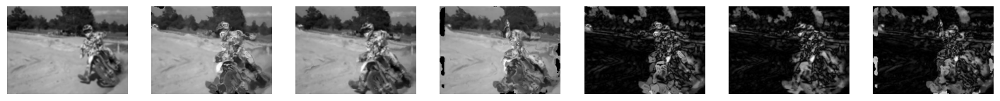

[29.48327582771784, 25.28982498493114, 26.414110482634158, 19.126300879203047, 15.790924761648327]
[30.40516885414354, 25.307694207733526, 26.393890122223304, 19.410550627469817, 16.697281958250795]
[29.167366100610536, 25.041516168122794, 26.20748839327362, 19.064328654349097, 15.119519754828296]
Moyenne PSNR Horn-Schunck: 23.220887387226902
Moyenne PSNR Lucas-Kanade: 23.6429171539642
Moyenne PSNR Farneback: 22.92004381423687


In [16]:
from skimage.metrics import peak_signal_noise_ratio

psnrs_HS, psnrs_LK, psnrs_Fa = [], [], []
for name in ['taxi', 'traffic', 'table', 'car', 'bike']:
    print(name)
    img1 = io.imread(name+'1.png').astype(np.float32)/255.
    img2 = io.imread(name+'2.png').astype(np.float32)/255.
    img1 = filters.gaussian(img1, sigma=1)
    img2 = filters.gaussian(img2, sigma=1)
    flow_HS = horn_schunck(img1, img2, lambda_=0.01, Niter=100)
    flow_LK = lucas_kanade(img1, img2, window_size=21)
    flow_Fa = farneback(img1, img2)
    im1_warp_HS = warp(flow_HS, img2)
    im1_warp_LK = warp(flow_LK, img2)
    im1_warp_Fa = warp(flow_Fa, img2)
    psnrs_HS.append(peak_signal_noise_ratio(img1, im1_warp_HS))
    psnrs_LK.append(peak_signal_noise_ratio(img1, im1_warp_LK))
    psnrs_Fa.append(peak_signal_noise_ratio(img1, im1_warp_Fa))
    plt.figure(figsize=(18, 4))
    plt.subplot(171)
    plt.axis('off')
    plt.imshow(img1,cmap='gray')
    plt.subplot(172)
    plt.axis('off')
    plt.imshow(im1_warp_HS,cmap='gray')
    plt.subplot(173)
    plt.axis('off')
    plt.imshow(im1_warp_LK,cmap='gray')
    plt.subplot(174)
    plt.axis('off')
    plt.imshow(im1_warp_Fa,cmap='gray')
    plt.subplot(175)
    plt.axis('off')
    plt.imshow(np.abs(img1 - im1_warp_HS),cmap='gray') # absolute difference images
    plt.subplot(176)
    plt.axis('off')
    plt.imshow(np.abs(img1 - im1_warp_LK),cmap='gray') # absolute difference images
    plt.subplot(177)
    plt.axis('off')
    plt.imshow(np.abs(img1 - im1_warp_Fa),cmap='gray') # absolute difference images
    plt.show()

print(psnrs_HS)
print(psnrs_LK)
print(psnrs_Fa)

# Moyenne des PSNR pour chaque méthode
print("Moyenne PSNR Horn-Schunck:", np.mean(psnrs_HS))
print("Moyenne PSNR Lucas-Kanade:", np.mean(psnrs_LK))
print("Moyenne PSNR Farneback:", np.mean(psnrs_Fa))

**Answer:** According to the psnr values, the Horn-Schunck method is the best followed very closely by the Lucas-Kanade method then the Farneback method. Visually, the best method is the difference btw the wrap and the image is the darkest.


## IV - Long-term motion estimation

Although robust between consecutive images, optical flow estimators are less efficient between distant images, especially in the following complex situations: variations in illumination, temporary occlusions, zooms, non-rigid distortions or transparency.  However, some dynamic scene analysis applications (visual object tracking, video indexing, action description...) require a dense mapping between distant (non-consecutive) images.

Let us consider a sequence of N+1 RGB images $I_n$ (with n between 0 and N) where $I_0$ is a so-called reference image. In this context, our objective is to estimate long term motion vectors between the reference image $I_0$ and each image $I_n$ with $n \neq 0$. In particular, two cases can be considered:

* **from-the-reference**: estimating long-term displacement field from $I_0$ to $I_n$
* **to-the-reference**: estimation of long-term displacement field from $I_n$ to $I_0$

We focus in this lab session on the to-the-reference strategy. To deal with the problem of dense mapping between pairs of images {$I_n$,$I_0$} with $n>0$, we will exploit an optical flow estimator (*Horn Schunck*, *Lucas-Kanade*, *Farneback* or all 3!) and implement two types of temporal integration of optical flow fields :

* **direct integration**: estimation of optical flow for each pair {$I_n$,$I_0$} independently,
* **sequential integration**: consists in concatenating optical flow vectors computed between consecutive images from $I_n$ to $I_0$.

Both integration techniques will be implemented in the context of **object visual tracking** in video sequences. The targeted application consists in estimating for the whole sequence the exact location of a manually defined region of interest in the reference image $I_0$. A video sequence containing 20 images is provided with associated groundtruth segmentations: `swan`.

### Direct integration

In [17]:
def propagate_mask(flow, img_current, mask_begin):
    new_mask = np.zeros(shape=img_current.shape[:2])
    for x in range(img_current.shape[0]):
        for y in range(img_current.shape[1]):
            x_, y_ = np.rint(x+flow[x,y,1]).astype(int), np.rint(y+flow[x,y,0]).astype(int)
            if (x_>=0) and (x_<img_current.shape[0]) and (y_>=0) and (y_<img_current.shape[1]):
                if mask_begin[x_,y_] > 0:
                    new_mask[x,y] = 255
    return new_mask.astype(np.uint8)

In [18]:
def DICE_assessment(groundtruth, estimated):
    A = groundtruth > 0
    B = estimated > 0
    TP = len(np.nonzero(A*B)[0])
    FN = len(np.nonzero(A*(~B))[0])
    FP = len(np.nonzero((~A)*B)[0])
    DICE = 0
    if (FP+2*TP+FN) != 0:
        DICE = float(2)*TP/(FP+2*TP+FN)
    return DICE

**Question 14 -** Implement the **direct integration** of optical flow fields estimated with *Horn Schunck*, *Lucas Kanade* and *Farneback* methods for each pair of images {$I_n$,$I_0$} from the `swan` sequence. Do not forget to use `skimage.color.rgb2gray()` to process grayscale images. Exploit the `propagate_mask(flow, img_current, mask_begin)` function provided above to propagate the segmentation mask (`mask_begin`) defined in the reference image $I_0$ to the $I_n$ image (`img_current`) through the estimated displacement field `flow`. The routine `mark_boundaries()` from `skimage.segmentation` will be used to overlay both propagated and groundtruth masks on source images. Additionally to these visualizations, the quality of the propagated segmentation masks will be evaluated for each image using the Dice score implemented in `DICE_assessment(groundtruth, estimated)` and comparing both groundtruth (`groundtruth`) and estimated (`estimated`) masks. The Dice scores obtained for each optical flow estimator will be respectively stored in `dir_dices_HS`, `dir_dices_LK` and `dir_dices_Fa` lists.

2


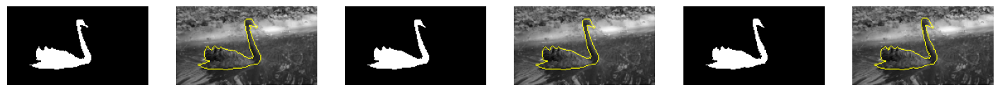

3


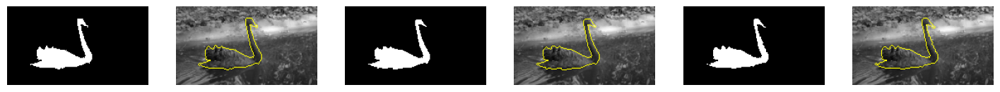

4


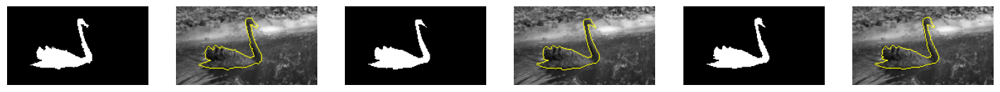

5


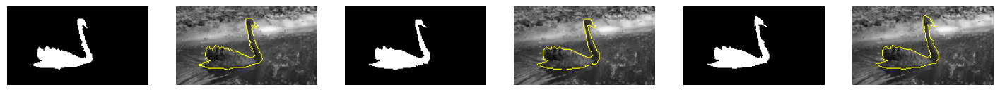

6


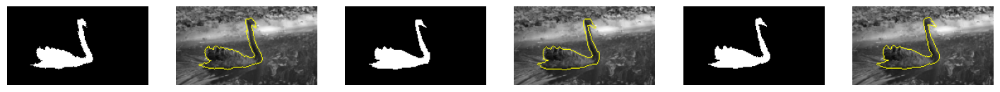

7


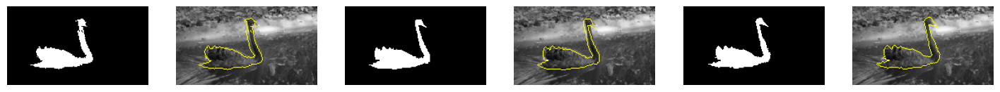

8


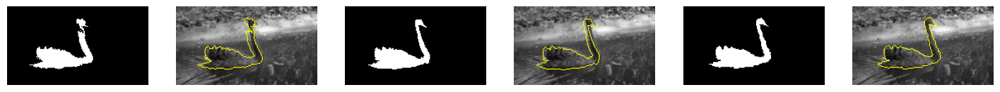

9


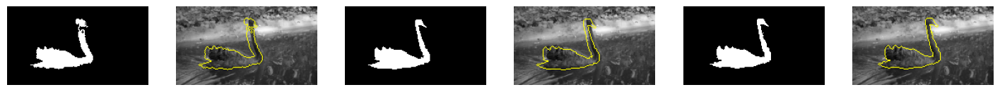

10


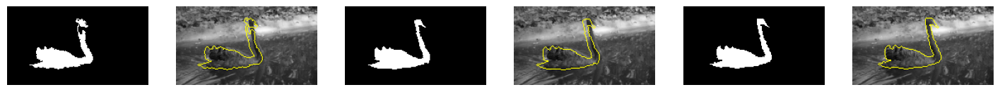

11


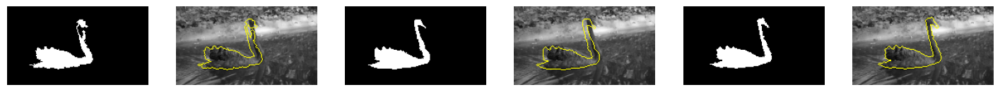

12


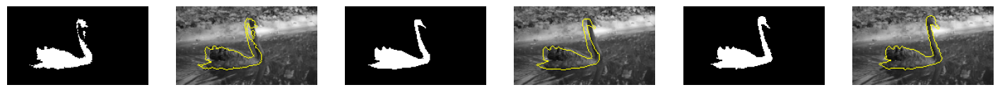

13


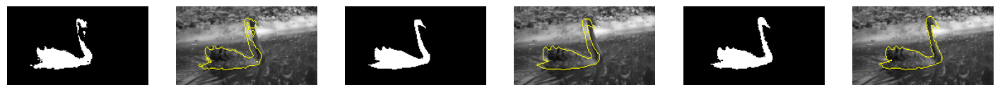

14


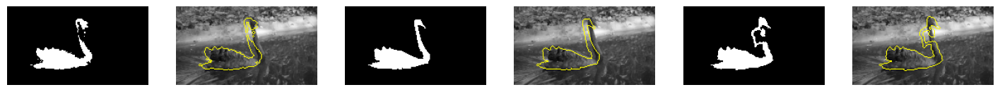

15


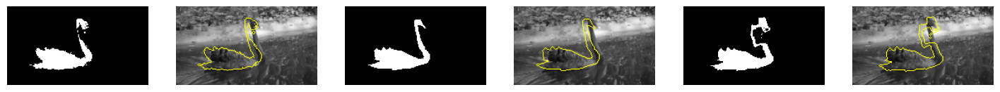

16


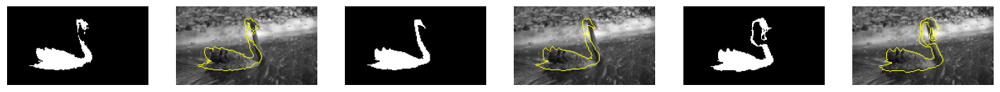

17


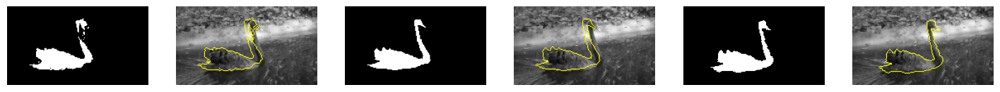

18


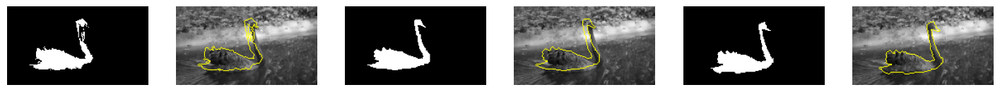

19


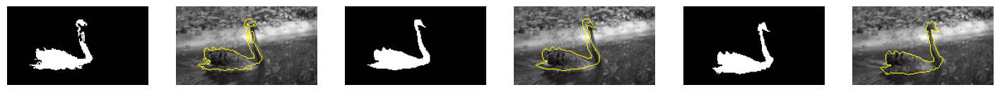

20


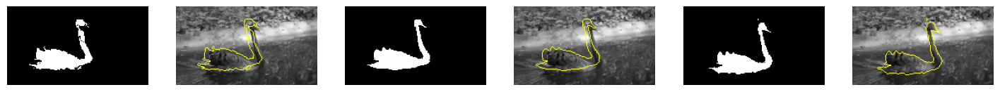

In [19]:
from skimage.color import rgb2gray
from skimage.segmentation import mark_boundaries

im_begin = 1
im_end = 20

name = 'swan'
img_begin = io.imread(name+'-%0*d.bmp'%(2,im_begin)).astype(np.float32)/255.
mask_begin = io.imread(name+'-%0*d.png'%(2,im_begin))
img_begin =rgb2gray(img_begin)

dir_dices_HS, dir_dices_LK, dir_dices_Fa = [], [], []

for im in range(im_begin+1,im_end+1):
    print(im)
    img_current = io.imread(name+'-%0*d.bmp'%(2,im)).astype(np.float32)/255.
    mask_current = io.imread(name+'-%0*d.png'%(2,im))
    img_current = rgb2gray(img_current)
    flow_HS = horn_schunck(img_current, img_begin, lambda_=0.01, Niter=100)
    propagation_HS = propagate_mask(flow_HS, img_current, mask_begin)
    boundaries_HS = mark_boundaries(img_current, propagation_HS)
    dir_dices_HS.append(DICE_assessment(mask_current, propagation_HS))

    flow_LK = lucas_kanade(img_current, img_begin, window_size=21)
    propagation_LK = propagate_mask(flow_LK, img_current, mask_begin)
    boundaries_LK = mark_boundaries(img_current, propagation_LK)
    dir_dices_LK.append(DICE_assessment(mask_current, propagation_LK))

    flow_Fa = farneback(img_current, img_begin)
    propagation_Fa = propagate_mask(flow_Fa, img_current, mask_begin)
    boundaries_Fa = mark_boundaries(img_current, propagation_Fa)
    dir_dices_Fa.append(DICE_assessment(mask_current, propagation_Fa))

    plt.figure(figsize=(18, 4))
    plt.subplot(161)
    plt.axis('off')
    plt.imshow(propagation_HS,cmap='gray')
    plt.subplot(162)
    plt.axis('off')
    plt.imshow(boundaries_HS)
    plt.subplot(163)
    plt.axis('off')
    plt.imshow(propagation_LK,cmap='gray')
    plt.subplot(164)
    plt.axis('off')
    plt.imshow(boundaries_LK)
    plt.subplot(165)
    plt.axis('off')
    plt.imshow(propagation_Fa,cmap='gray')
    plt.subplot(166)
    plt.axis('off')
    plt.imshow(boundaries_Fa)
    plt.show()

### Sequential integration

Towards an optimal implementation of the sequential integration, we focus on the recursive scheme displayed below for the computation of the long-term displacement vector $d_{n,0}(x_n)$ linking the pixel *xn* in *In* to a sub-pixel position *x0* in *I0*.

\begin{align*}
d_{n,0}(x_n) = x_n - \bar{x}_0 = x_n - \big[u_{n, n-1}(x_{n}) + d_{n-1,0}\big(x_n+u_{n, n-1}(x_{n})\big)\big]   
\end{align*}

We notice here the difference between the estimated optical flow vectors between consecutive images (noted $u$) and the long-term displacement vectors (noted $d$). The concatenation of the optical flow field $u_{n,n-1}$ (`unary_flow`) and the long-term displacement field (`to_ref_flow`) estimated for image pair {$I_{n-1}$,$I_0$} can be performed using the `concatenation(unary_flow, to_ref_flow)` function provided below.

In [20]:
from scipy.interpolate import RegularGridInterpolator

def concatenation(unary_flow, to_ref_flow):
    flow = np.zeros((unary_flow.shape[0], unary_flow.shape[1], 2), dtype=float)

    x0 = np.arange(0, unary_flow.shape[0])
    y0 = np.arange(0, unary_flow.shape[1])

    # create interpolators for both flow components
    fx = RegularGridInterpolator((x0, y0), to_ref_flow[:, :, 1], method='cubic', bounds_error=False, fill_value=None)
    fy = RegularGridInterpolator((x0, y0), to_ref_flow[:, :, 0], method='cubic', bounds_error=False, fill_value=None)

    for x in range(unary_flow.shape[0]):
        for y in range(unary_flow.shape[1]):
            # compute new coordinates based on unary flow
            coords = np.array([x + unary_flow[x, y, 1], y + unary_flow[x, y, 0]])

            # interpolate and update the flow
            flow_x = fx(coords)
            flow_y = fy(coords)
            flow[x, y, 1] = unary_flow[x, y, 1] + flow_x.item()
            flow[x, y, 0] = unary_flow[x, y, 0] + flow_y.item()

    return flow

**Question 15 -** Using the resursive scheme and based on `concatenation()`, implement the **sequential integration** using *Horn Schunck*, *Lucas Kanade* and *Farneback* methods for each pair of images {$I_n$,$I_0$} from the `swan` sequence. As previously, do not forget to use `skimage.color.rgb2gray()` to process grayscale images. Exploit the `propagate_mask(flow, img_current, mask_begin)` function as well as the `mark_boundaries()` routine to provide visualizations. The quality of the propagated segmentation masks will be evaluated for each image using the Dice score implemented in `DICE_assessment(groundtruth, estimated)`. The Dice scores obtained for each optical flow estimator will be respectively stored in `seq_dices_HS`, `seq_dices_LK` and `seq_dices_Fa` lists.

2


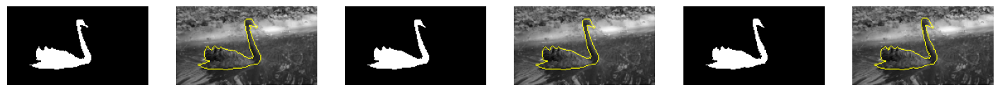

3


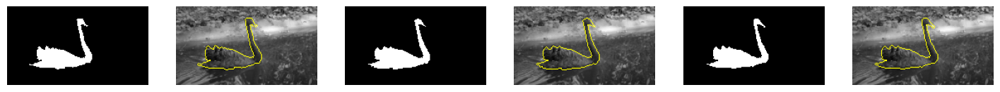

4


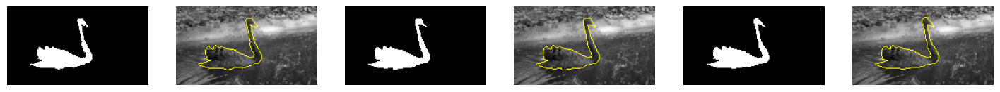

5


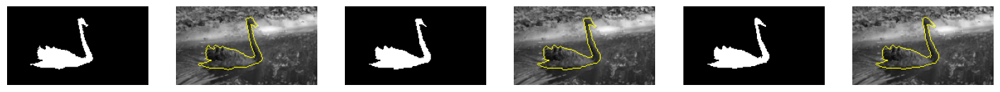

6


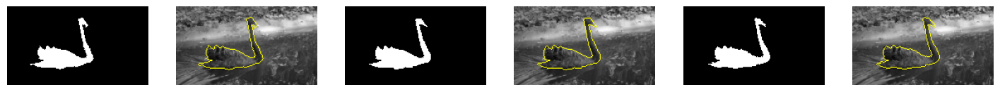

7


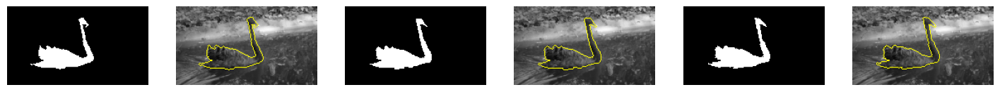

8


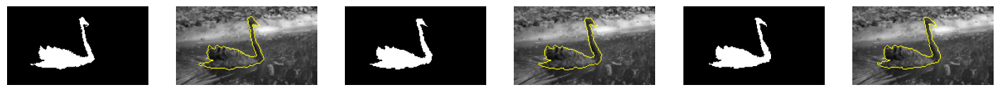

9


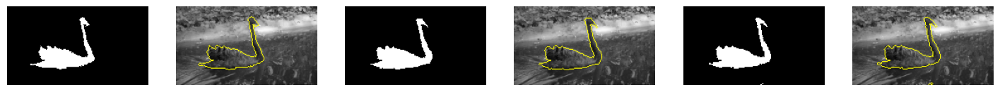

10


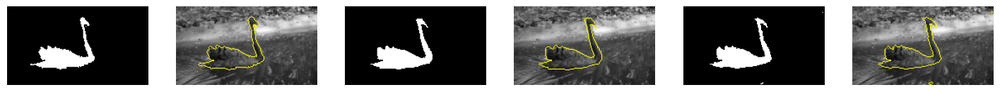

11


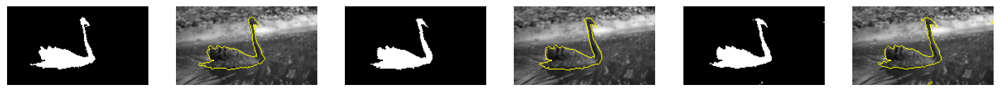

12


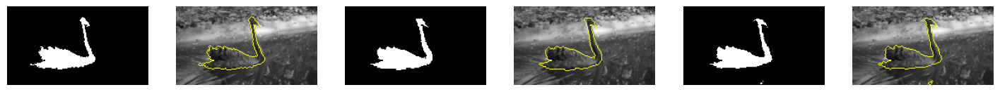

13


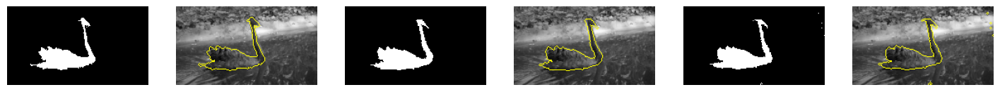

14


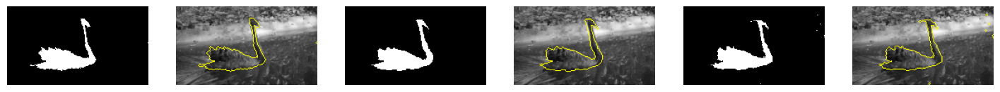

15


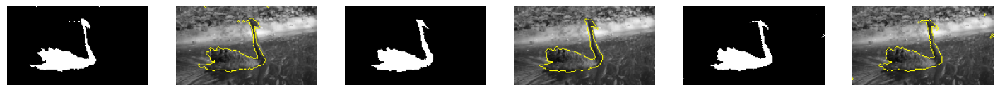

16


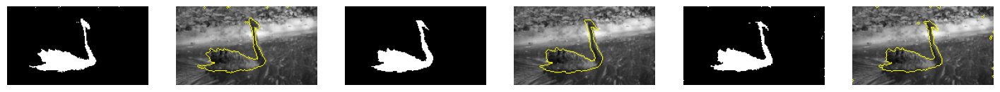

17


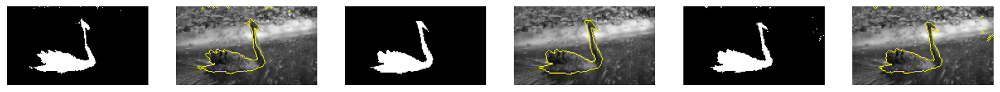

18


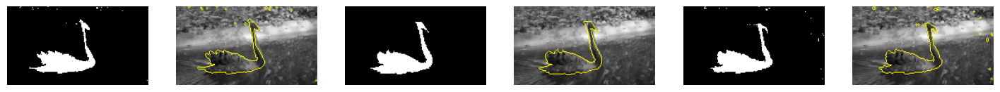

19


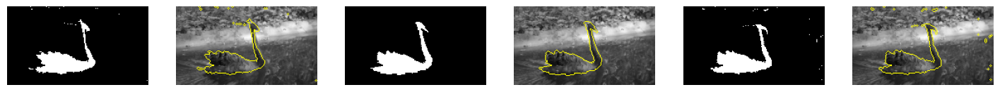

20


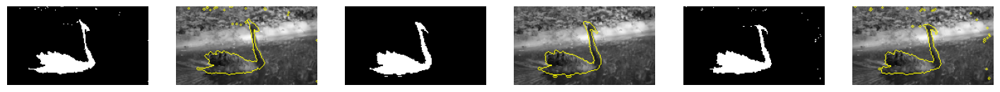

In [21]:
from skimage.color import rgb2gray
from skimage.segmentation import mark_boundaries
from skimage import io
import numpy as np
import matplotlib.pyplot as plt

im_begin = 1
im_end = 20

name = 'swan'
img_begin = io.imread(name+'-%0*d.bmp'%(2,im_begin)).astype(np.float32)/255.
mask_begin = io.imread(name+'-%0*d.png'%(2,im_begin))
img_begin = rgb2gray(img_begin)

seq_dices_HS, seq_dices_LK, seq_dices_Fa = [], [], []

to_ref_flow_HS = np.zeros((img_begin.shape[0], img_begin.shape[1], 2))
to_ref_flow_LK = np.zeros((img_begin.shape[0], img_begin.shape[1], 2))
to_ref_flow_Fa = np.zeros((img_begin.shape[0], img_begin.shape[1], 2))

prev_img = img_begin
for im in range(im_begin+1, im_end+1):
    print(im)
    img_current = io.imread(name+'-%0*d.bmp'%(2,im)).astype(np.float32)/255.
    mask_current = io.imread(name+'-%0*d.png'%(2,im))
    img_current = rgb2gray(img_current)

    unary_flow_HS = horn_schunck(img_current, prev_img, lambda_=0.01, Niter=100)
    unary_flow_LK = lucas_kanade(img_current, prev_img, window_size=21)
    unary_flow_Fa = farneback(img_current, prev_img)

    to_ref_flow_HS = concatenation(unary_flow_HS, to_ref_flow_HS)
    to_ref_flow_LK = concatenation(unary_flow_LK, to_ref_flow_LK)
    to_ref_flow_Fa = concatenation(unary_flow_Fa, to_ref_flow_Fa)

    propagation_HS = propagate_mask(to_ref_flow_HS, img_current, mask_begin)
    propagation_LK = propagate_mask(to_ref_flow_LK, img_current, mask_begin)
    propagation_Fa = propagate_mask(to_ref_flow_Fa, img_current, mask_begin)

    boundaries_HS = mark_boundaries(img_current, propagation_HS)
    boundaries_LK = mark_boundaries(img_current, propagation_LK)
    boundaries_Fa = mark_boundaries(img_current, propagation_Fa)

    seq_dices_HS.append(DICE_assessment(mask_current, propagation_HS))
    seq_dices_LK.append(DICE_assessment(mask_current, propagation_LK))
    seq_dices_Fa.append(DICE_assessment(mask_current, propagation_Fa))

    prev_img = img_current

    plt.figure(figsize=(18, 4))
    plt.subplot(161)
    plt.axis('off')
    plt.imshow(propagation_HS, cmap='gray')
    plt.subplot(162)
    plt.axis('off')
    plt.imshow(boundaries_HS)
    plt.subplot(163)
    plt.axis('off')
    plt.imshow(propagation_LK, cmap='gray')
    plt.subplot(164)
    plt.axis('off')
    plt.imshow(boundaries_LK)
    plt.subplot(165)
    plt.axis('off')
    plt.imshow(propagation_Fa, cmap='gray')
    plt.subplot(166)
    plt.axis('off')
    plt.imshow(boundaries_Fa)
    plt.show()


**Question 16 -** Use the following code to display how evolves the accuracy of mask propagation (through Dice scores) along the sequence for each couple optical flow/integration scheme (6 combinations in total). Which integration is the most efficient? What are the advantages/drawbacks of each? Which optical flow estimator gives the best results?

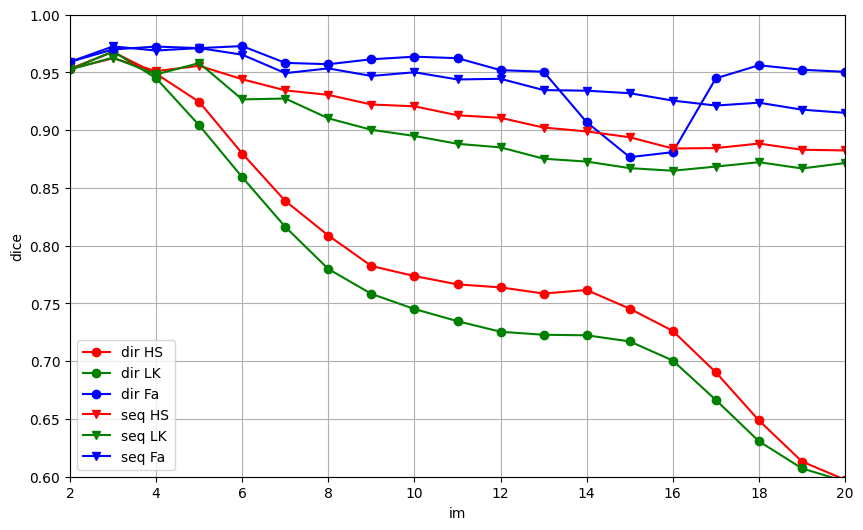

In [22]:
plt.figure(figsize=(10, 6))
x = range(im_begin+1,im_end+1)
plt.plot(x,dir_dices_HS, marker='o', color='r')
plt.plot(x,dir_dices_LK, marker='o', color='g')
plt.plot(x,dir_dices_Fa, marker='o', color='b')
plt.plot(x,seq_dices_HS, marker='v', color='r')
plt.plot(x,seq_dices_LK, marker='v', color='g')
plt.plot(x,seq_dices_Fa, marker='v', color='b')
plt.xlim((im_begin+1,im_end))
plt.ylim((0.6,1))
plt.ylabel('dice')
plt.xlabel("im")
plt.grid()
plt.legend(['dir HS', 'dir LK', 'dir Fa', 'seq HS', 'seq LK', 'seq Fa'])
plt.show()

**Answer**: According to this grpah,the Fa estimator gives the best result because it stays constant through all of the images wheras the other methods decrease sharply (especially the sequential one because it keeps a high value through the images). The direct integration is simpler and it works with independent frames but it accumulates errors and doesn't fit for long tracking wheras the sequential one maintains consistency over time, better for long sequence but small errors can propagate. Overall, the sequential is better than the direct methods.